# EDA_Enfermedades_Cardiacas
##### Cristina Hidalgo

Según las estadísticas de la OMS, cada año mueren 17,9 millones por enfermedades del corazón.
El estudio médico dice que el estilo de vida humano es la razón principal detrás de este problema cardíaco.
Aparte de esto, hay muchos factores clave que advierten que la persona puede o no tener riesgo de enfermedad cardíaca.

¿Cómo se podrían estimar los factores de riesgo de desarrollar una enfermedad cardiovascular en los próximos años?

## Introducción <a name="Introducción"></a>

**Problema:**
La principal causa de muerte en los países desarrollados se deben a enfermedades cardiovasculares. Las cardiopatías son desde hace 20 años la causa principal de mortalidad en todo el mundo, si bien ahora provocan más muertes que nunca. El pronóstico temprano de las enfermedades cardiovasculares puede ayudar en la toma de decisiones sobre cambios en el estilo de vida en pacientes de alto riesgo y/o a reducir las complicaciones de la enfermedad. Esta investigación tiene como hipótesis inicial la intención de identificar los factores de riesgo más relevantes de la enfermedad cardíaca.

**Fuente:**
El conjunto de datos ha sido recogido por la organización Framingham Heart Study y está disponible públicamente en el sitio web: https://www.framinghamheartstudy.org/ y en https://ocw.mit.edu/courses/15-071-the-analytics-edge-spring-2017/resources/framingham/. Estos datos provienen de un estudio cardiovascular en curso en los residentes de la ciudad de Framingham, Massachusetts. El objetivo de la clasificación es predecir si el paciente tiene un riesgo de enfermedad cardiaca (CHD) en los próximos 10 años (CHD10)
El conjunto de datos proporciona la información de los pacientes e incluye más de 4.000 registros y 15 atributos (factores de riesgo potencial). Existen factores de riesgo tanto demográficos como de hábitos y médicos.

***Atributos:***
##### Demográfico:
* 0 - Sexo: 0-femenino y 1-masculino. (Categórica).
* 1 - Edad: Edad del paciente (años). (Numérica).
* 2 - Educación: [1- Educación Secundaria Obligatoria, 2- Bachillerato, 3-Formación Profesional de grado medio o superior, 4- Universidad]. (Categórica).

##### Hábitos:
* 3 - Fumador Actual: si el paciente es (1) o no (0) fumador actual. (Categórica) .
* 4 - Cigarillos día: la cantidad de cigarrillos que la persona fumó en promedio en un día (puede considerarse continuo ya que uno puede tener cualquier cantidad de cigarrillos, incluso medio cigarrillo). (Numérica).

##### Información sobre el historial médico en el momento del primer examen.:
* 5 - Meds PA: si el paciente tomaba o no medicamentos para la presión arterial en el momento del primer examen. (Categórica).
* 6 - Ictus prev: si el paciente ha tenido o no un ictus previo al momento del primer examen. (Categórica).
* 7 - Hipertensión: si el paciente era o no hipertenso en el momento del primer examen. (Categórica).
* 8 - Diabetes: si el paciente tenía o no diabetes en el momento del primer examen. (Categórica).

##### Información sobre la condición médica actual:
* 9 - Colesterol: nivel de colesterol total en la actualidad (mg/dL). (Numérica).
* 10 - PAS: presión arterial sistólica en la actualidad (mmHg). Se trata de la presión máx que ejerce el corazón al latir. (Numérica).
* 11 - PAD: presión arterial diastólica en la actualidad (mmHg). Se trata de la presión arterial entre latidos. (Numérica).
* 12 - IMC: Índice de Masa Corporal en la actualidad (kg/m2). (Numérica).
* 13 - RC: frecuencia cardíaca en la actualidad (latidos/min). (Numérica).
* 14 - Glucosa: nivel de glucosa en la actualidad (mg/dL). (Numérica).

##### Variable de destino para predecir:
* 15 - CHD10: Se trata de una variable binaria que indica si una persona tiene un riesgo de desarrollar una enfermedad coronaria en los próximos 10 años. Un valor de “1” significa que la persona tiene un riesgo de desarrollar una enfermedad coronaria en los próximos 10 años, mientras que un valor de “0” significa que la persona no tiene un riesgo significativo de sufrirlo. (Categórica).

### ¿Qué es la CHD?

La enfermedad coronaria (CHD, por sus siglas en inglés) es una afección en la que las arterias coronarias, que suministran sangre al músculo cardíaco, se estrechan o se bloquean debido a la acumulación de placa. Esto puede reducir el flujo de sangre al corazón y aumentar el riesgo de sufrir un ataque cardíaco o angina de pecho.

La variable de destino “Riesgo en 10 años de enfermedad coronaria (CHD10)" puede ser útil para identificar a las personas que podrían beneficiarse de intervenciones preventivas, como cambios en el estilo de vida o medicamentos para reducir el riesgo de enfermedad coronaria.

## Análisis Exploratorio de Datos (EDA) <a name="EDA"></a>

### Importación de librerías

In [53]:
import numpy as np
import pandas as pd

In [54]:
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score

from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
%config InlineBackend.figure_format ='retina'
%matplotlib inline

La fuente de datos es: https://www.framinghamheartstudy.org/

In [55]:
data_origen = pd.read_csv('./data/framingham.csv', sep=',', encoding='latin-1')

### Información de los datos recogidos

In [56]:
data_origen.shape

(4238, 16)

In [57]:
data_origen.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4238 entries, 0 to 4237
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Sexo             4238 non-null   int64  
 1   Edad             4238 non-null   int64  
 2   Educación        4133 non-null   float64
 3   Fumador Actual   4238 non-null   int64  
 4   Cigarrillos día  4209 non-null   float64
 5   Meds PA          4185 non-null   float64
 6   Ictus prev       4238 non-null   int64  
 7   Hipertensión     4238 non-null   int64  
 8   Diabetes         4238 non-null   int64  
 9   Colesterol       4188 non-null   float64
 10  PAS              4238 non-null   float64
 11  PAD              4238 non-null   float64
 12  IMC              4219 non-null   float64
 13  RC               4237 non-null   float64
 14  Glucosa          3850 non-null   float64
 15  CHD10            4238 non-null   int64  
dtypes: float64(9), int64(7)
memory usage: 529.9 KB


Mostramos las primeras líneas del csv utilizado.

In [58]:
data_origen.describe()

,Sexo,Edad,Educación,Fumador Actual,Cigarrillos día,Meds PA,Ictus prev,Hipertensión,Diabetes,Colesterol,PAS,PAD,IMC,RC,Glucosa,CHD10
count,4238.000000,4238.000000,4133.000000,4238.000000,4209.000000,4185.000000,4238.000000,4238.000000,4238.000000,4188.000000,4238.000000,4238.000000,4219.000000,4237.000000,3850.000000,4238.000000
mean,0.429212,49.584946,1.978950,0.494101,9.003089,0.029630,0.005899,0.310524,0.025720,236.721585,132.352407,82.893464,25.802008,75.878924,81.966753,0.151958
std,0.495022,8.572160,1.019791,0.500024,11.920094,0.169584,0.076587,0.462763,0.158316,44.590334,22.038097,11.910850,4.080111,12.026596,23.959998,0.359023
min,0.000000,32.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,107.000000,83.500000,48.000000,15.540000,44.000000,40.000000,0.000000
25%,0.000000,42.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,206.000000,117.000000,75.000000,23.070000,68.000000,71.000000,0.000000
50%,0.000000,49.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,234.000000,128.000000,82.000000,25.400000,75.000000,78.000000,0.000000
75%,1.000000,56.000000,3.000000,1.000000,20.000000,0.000000,0.000000,1.000000,0.000000,263.000000,144.000000,89.875000,28.040000,83.000000,87.000000,0.000000
max,1.000000,70.000000,4.000000,1.000000,70.000000,1.000000,1.000000,1.000000,1.000000,696.000000,295.000000,142.500000,56.800000,143.000000,394.000000,1.000000


In [59]:
data_origen

,Sexo,Edad,Educación,Fumador Actual,Cigarrillos día,Meds PA,Ictus prev,Hipertensión,Diabetes,Colesterol,PAS,PAD,IMC,RC,Glucosa,CHD10
0,1,39,4.0,0,0.0,0.0,0,0,0,195.0,106.0,70.0,26.97,80.0,77.0,0
1,0,46,2.0,0,0.0,0.0,0,0,0,250.0,121.0,81.0,28.73,95.0,76.0,0
2,1,48,1.0,1,20.0,0.0,0,0,0,245.0,127.5,80.0,25.34,75.0,70.0,0
3,0,61,3.0,1,30.0,0.0,0,1,0,225.0,150.0,95.0,28.58,65.0,103.0,1
4,0,46,3.0,1,23.0,0.0,0,0,0,285.0,130.0,84.0,23.10,85.0,85.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4233,1,50,1.0,1,1.0,0.0,0,1,0,313.0,179.0,92.0,25.97,66.0,86.0,1
4234,1,51,3.0,1,43.0,0.0,0,0,0,207.0,126.5,80.0,19.71,65.0,68.0,0
4235,0,48,2.0,1,20.0,NaN,0,0,0,248.0,131.0,72.0,22.00,84.0,86.0,0
4236,0,44,1.0,1,15.0,0.0,0,0,0,210.0,126.5,87.0,19.16,86.0,NaN,0


### Comprobación Valores Nulos

In [60]:
data_origen.isnull().sum()

Sexo                 0
Edad                 0
Educación          105
Fumador Actual       0
Cigarrillos día     29
Meds PA             53
Ictus prev           0
Hipertensión         0
Diabetes             0
Colesterol          50
PAS                  0
PAD                  0
IMC                 19
RC                   1
Glucosa            388
CHD10                0
dtype: int64

Creamos un nuevo df con aquellas filas que contengan datos nulos y los analizamos.

In [61]:
data_origen_null = data_origen[data_origen.isnull().any(axis=1)]
data_origen_null

,Sexo,Edad,Educación,Fumador Actual,Cigarrillos día,Meds PA,Ictus prev,Hipertensión,Diabetes,Colesterol,PAS,PAD,IMC,RC,Glucosa,CHD10
14,0,39,2.0,1,9.0,0.0,0,0,0,226.0,114.0,64.0,22.35,85.0,NaN,0
21,0,43,1.0,0,0.0,0.0,0,0,0,185.0,123.5,77.5,29.89,70.0,NaN,0
26,0,60,1.0,0,0.0,0.0,0,0,0,260.0,110.0,72.5,26.59,65.0,NaN,0
33,1,61,NaN,1,5.0,0.0,0,0,0,175.0,134.0,82.5,18.59,72.0,75.0,1
36,1,56,NaN,0,0.0,0.0,0,0,0,257.0,153.5,102.0,28.09,72.0,75.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4208,0,51,1.0,1,9.0,0.0,0,0,0,340.0,152.0,76.0,25.74,70.0,NaN,0
4229,0,51,3.0,1,20.0,0.0,0,1,0,251.0,140.0,80.0,25.60,75.0,NaN,0
4230,0,56,1.0,1,3.0,0.0,0,1,0,268.0,170.0,102.0,22.89,57.0,NaN,0
4235,0,48,2.0,1,20.0,NaN,0,0,0,248.0,131.0,72.0,22.00,84.0,86.0,0


### **Comprobación Valores Duplicados**

In [62]:
data_origen.duplicated().sum()

0

No hay datos duplicados.

### **Comprobación Outliers**

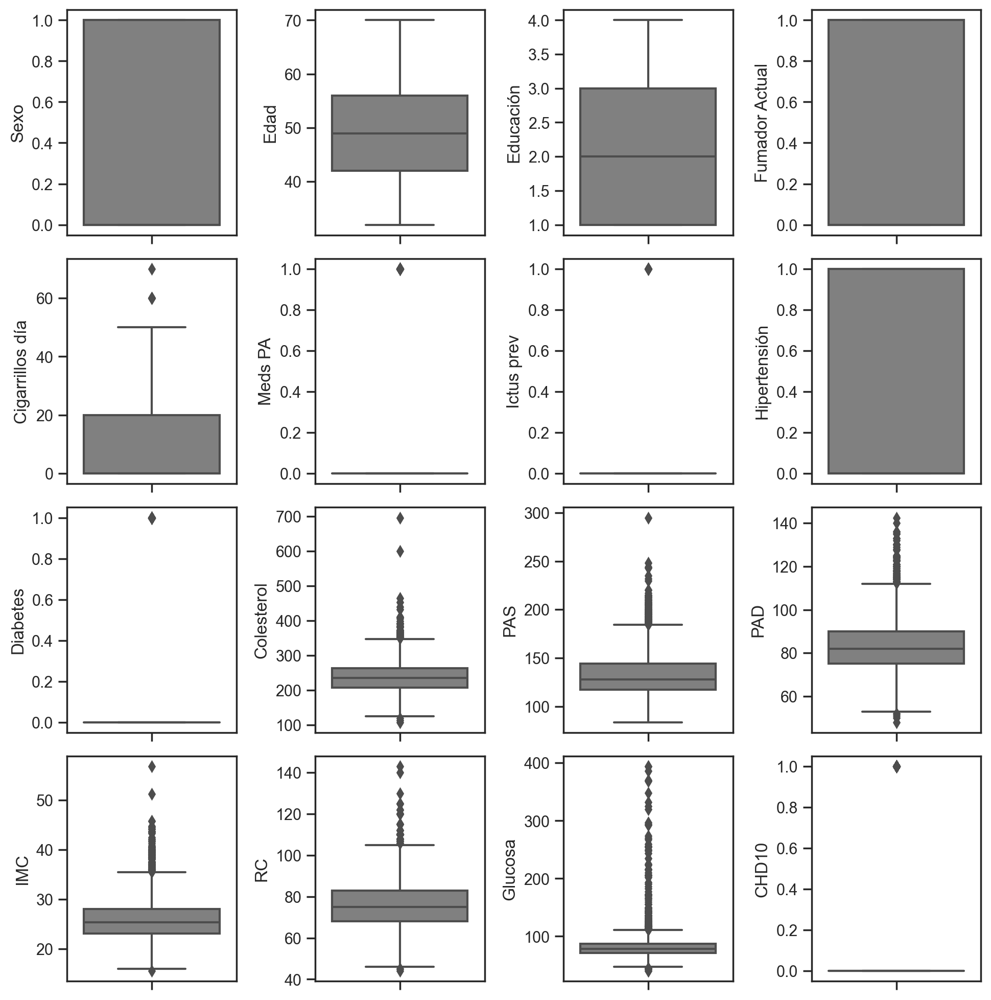

In [122]:
fig, ax = plt.subplots(figsize=(10,10), nrows=4, ncols=4)
ax = ax.flatten()

i = 0
for f,c in data_origen.items():
    sns.boxplot(y=c, ax=ax[i], palette=["gray"])
    i+=1
    if i==16:
        break
plt.tight_layout(pad=1.25, h_pad=0.8, w_pad=0.8);

De este boxplot podemos observar outliers en las variables "Colesterol", "PAS", "IMC", "RC" y "Glucosa".
Por ahora no vamos a eliminar los outliers ya que no afectan al análisis exploratorio de datos, pero para el Machine Learning sí será necesario.

In [64]:
# Eliminación de outliers.

# data = data_origen[~(data_origen['PAS'] > 220)]
# data = data_origen[~(data_origen['IMC'] > 50)]
# data = data_origen[~(data_origen['RC'] > 125)]
# data = data_origen[~(data_origen['Glucosa'] > 200)]
# data = data_origen[~(data_origen['Colesterol'] > 450)]
# print(data.shape)

In [65]:
#¿Cuántos outliers se han eliminado en total?

# print('Cantidad de outliers eliminados es de: ',len(data_origen[data_origen['PAS'] > 220]) + len(data_origen[data_origen['IMC'] > 43]) + len(
#     data_origen[data_origen['RC'] > 125]) + len(data_origen[data_origen['Glucosa'] > 200]) + len(
#     data_origen[data_origen['Colesterol'] > 450]))

Para visualizar la distribución de los datos para cada variable se crea un histograma para cada uno de ellos en una misma figura.

C:\Users\Cristina\AppData\Local\Temp\ipykernel_2360\1010498284.py:3: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared.
  data_origen.hist(ax = ax, color='gray')


array([[<Axes: title={'center': 'Sexo'}>,
        <Axes: title={'center': 'Edad'}>,
        <Axes: title={'center': 'Educación'}>,
        <Axes: title={'center': 'Fumador Actual'}>],
       [<Axes: title={'center': 'Cigarrillos día'}>,
        <Axes: title={'center': 'Meds PA'}>,
        <Axes: title={'center': 'Ictus prev'}>,
        <Axes: title={'center': 'Hipertensión'}>],
       [<Axes: title={'center': 'Diabetes'}>,
        <Axes: title={'center': 'Colesterol'}>,
        <Axes: title={'center': 'PAS'}>, <Axes: title={'center': 'PAD'}>],
       [<Axes: title={'center': 'IMC'}>, <Axes: title={'center': 'RC'}>,
        <Axes: title={'center': 'Glucosa'}>,
        <Axes: title={'center': 'CHD10'}>]], dtype=object)

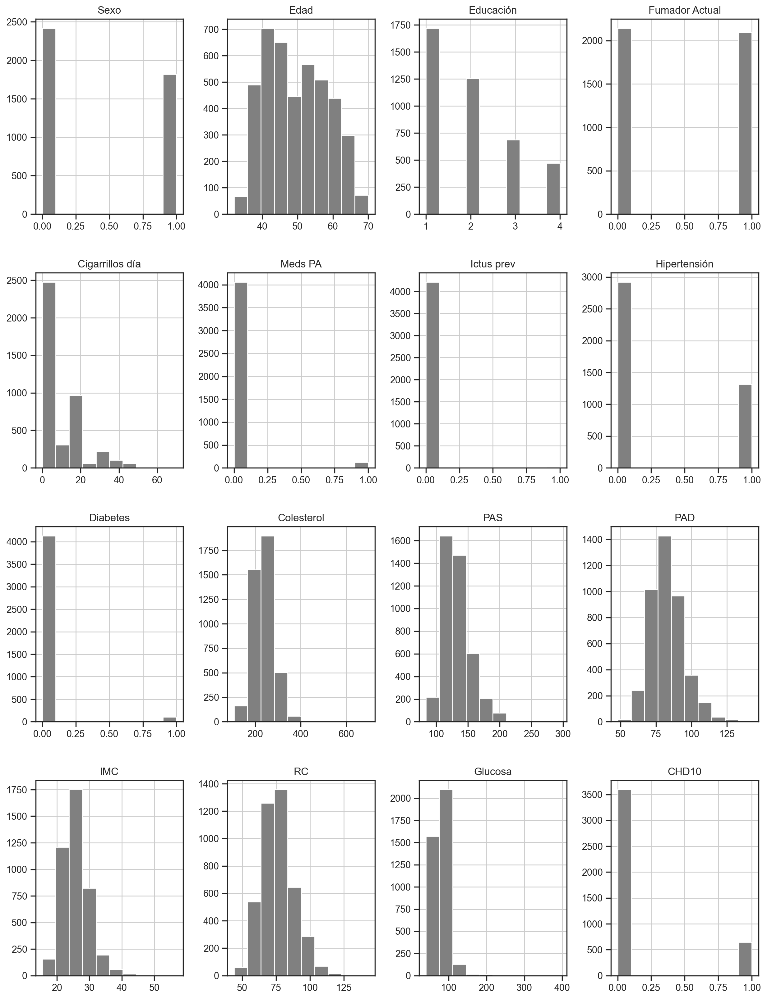

In [123]:
fig = plt.figure(figsize = (15,20))
ax = fig.gca()
data_origen.hist(ax = ax, color='gray')

Obtenido el histograma de las diferentes variables vamos a analizar la relación que existe entre ellas, es decir, vamos a comprobar que variables están correlacionadas entre sí y con el resultado.
Para ello, crearemos un mapa de calor.
Un mapa de calor es una representación gráfica de datos donde los valores individuales en una matriz se representan como colores. En este caso, los valores en la matriz de correlación se representan como colores en el mapa de calor, lo que permite ver rápidamente qué características están correlacionadas entre sí.

<Figure size 1500x1500 with 0 Axes>

<Axes: >

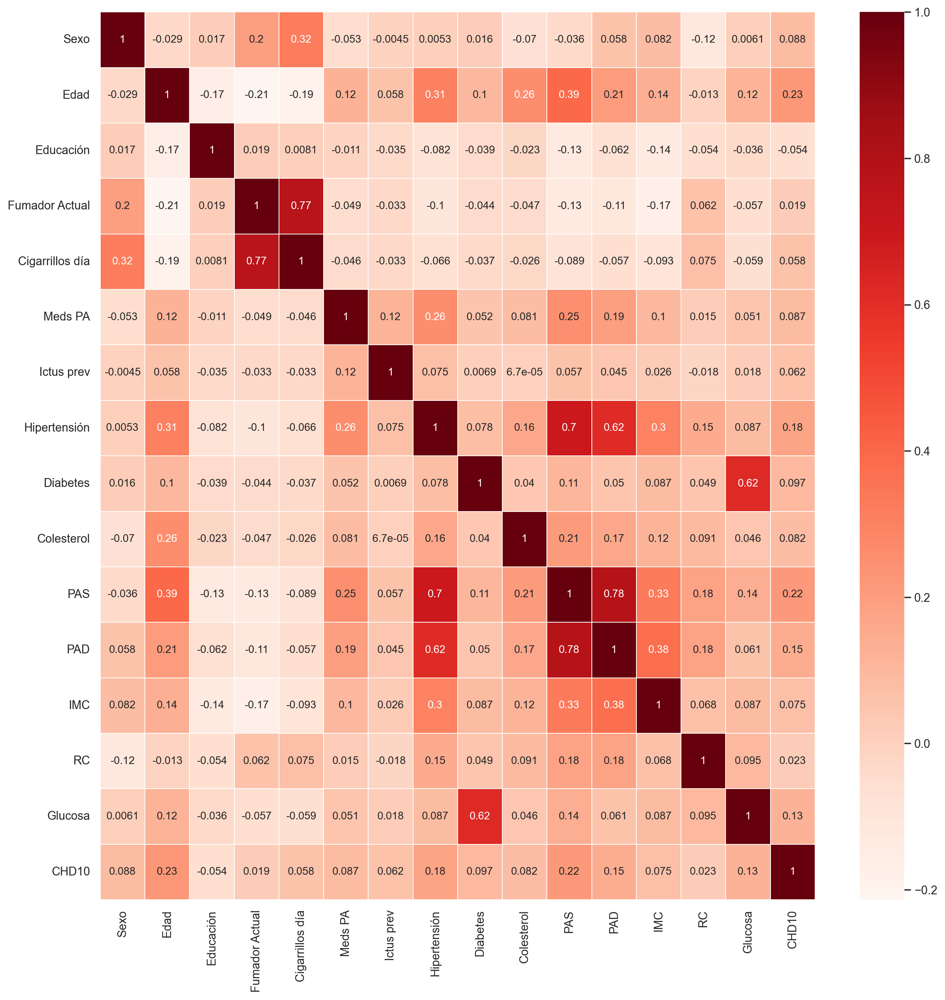

In [67]:
corr_data = data_origen.corr()

plt.figure(figsize=(15,15))
sns.set(font_scale=1)
sns.heatmap(corr_data, cmap='Reds', annot=True, linewidths=0.1, annot_kws={"fontsize":10})
plt.show()

El coeficiente de correlación mide la relación lineal entre dos variables y varía entre -1 y 1. Un valor cercano a 1 indica una fuerte correlación positiva, un valor cercano a -1 indica una fuerte correlación negativa y un valor cercano a 0 indica una falta de correlación.

Del heatmap se puede observar una fuerte relación entre "PAS", "PAD" e "Hipertensión" y entre "Fumador Actual" y "Cigarrillos día".

In [68]:
data_correlacion = data_origen.loc[:, ["PAS", "PAD", "Hipertensión", "Fumador Actual", "Cigarrillos día"]]
data_correlacion

,PAS,PAD,Hipertensión,Fumador Actual,Cigarrillos día
0,106.0,70.0,0,0,0.0
1,121.0,81.0,0,0,0.0
2,127.5,80.0,0,1,20.0
3,150.0,95.0,1,1,30.0
4,130.0,84.0,0,1,23.0
...,...,...,...,...,...
4233,179.0,92.0,1,1,1.0
4234,126.5,80.0,0,1,43.0
4235,131.0,72.0,0,1,20.0
4236,126.5,87.0,0,1,15.0


<Figure size 1500x1500 with 0 Axes>

<Axes: >

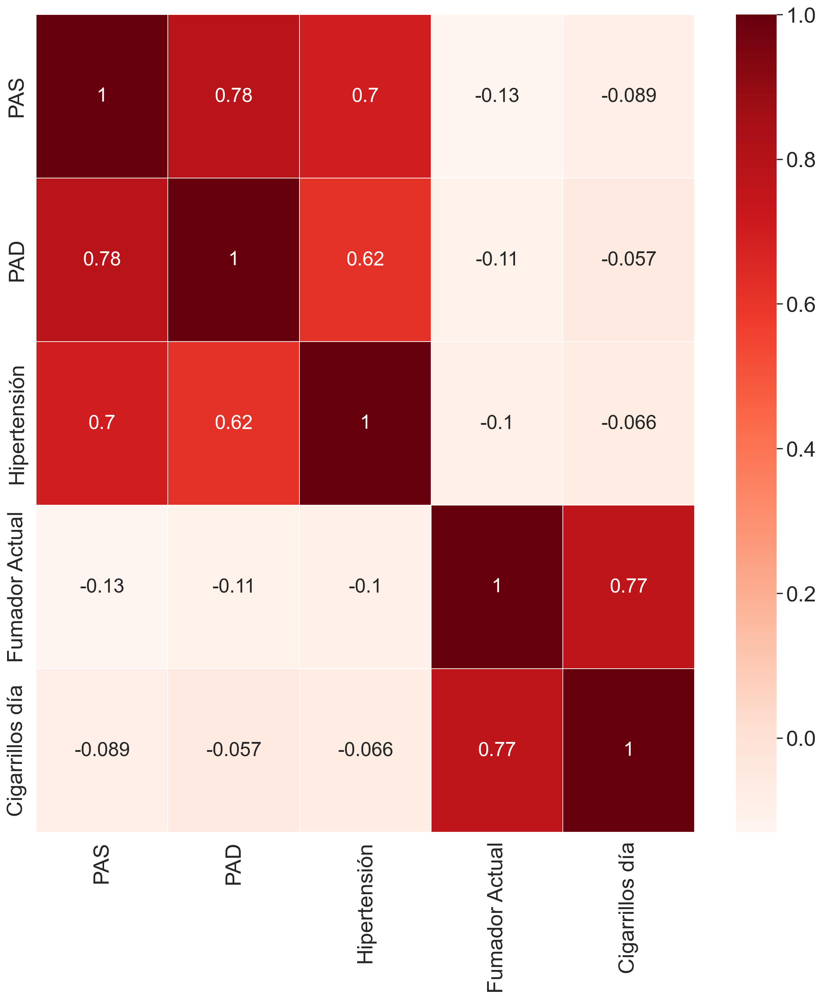

In [69]:
corr_data2 = data_correlacion.corr()

plt.figure(figsize=(15,15))
sns.set(font_scale=2)
sns.heatmap(corr_data2, cmap='Reds', annot=True, linewidths=0.1, annot_kws={"fontsize":20})
plt.show()

**Conclusiones de la correlación:**

Se fija un valor de 0.75 como indicador de fuerte correlación. Del heatmap se observa que entre la variabla PAS y PAD existe una relación de 0.78 y, como en la práctica, una presión arterial sistólica alta conlleva una presión arterial diastólica alta se procede a eliminar el PAD ya que es la que menor correlación tiene con nuestra variable de salida CHD10. 

La presión arterial sistólica es la presión que ejerce la sangre sobre las paredes de las arterias cuando el corazón se contrae y bombea sangre hacia el cuerpo. La presión arterial diastólica es la presión que ejerce la sangre sobre las paredes de las arterias cuando el corazón está en reposo entre latidos. Es decir, una PAS elevada conlleva una PAD elevada.

También se observa una fuerte correlación fuerte entre fumador actual y cigarillos día, pero me parece un dato significativo la cantidad de cigarros consumidos al día. Puede haber una gran diferencia entre fumar 1 o 30 al día.

## Limpieza de datos

Se elimina la columna "PAD".

In [70]:
data = data_origen.drop("PAD", axis=1)

Se procede a eliminar los valores nulos.

In [71]:
data.isnull().sum()

Sexo                 0
Edad                 0
Educación          105
Fumador Actual       0
Cigarrillos día     29
Meds PA             53
Ictus prev           0
Hipertensión         0
Diabetes             0
Colesterol          50
PAS                  0
IMC                 19
RC                   1
Glucosa            388
CHD10                0
dtype: int64

Se aprovecha para limpiar las filas de datos que contengan un valor nulo en alguna de las variables ya que no se puede obtener una relación global de todas las variables si hay datos nulos en alguna fila sobre cómo afecta el conjunto de las variables a la probabilidad de sufrir un fallo coronario durante los próximos 10 años en el paciente en cuestión.

In [72]:
data =  data.dropna()

#Comprobamos si se han eliminado todos los valores nulos correctamente
data.isnull().sum()

Sexo               0
Edad               0
Educación          0
Fumador Actual     0
Cigarrillos día    0
Meds PA            0
Ictus prev         0
Hipertensión       0
Diabetes           0
Colesterol         0
PAS                0
IMC                0
RC                 0
Glucosa            0
CHD10              0
dtype: int64

In [73]:
data.shape

(3656, 15)

## Estudio de las variables implicadas 
### ¿Cuál es la más importante en relación a las enfermedades cardiacas?

In [74]:
print(data.shape)
print(data.columns)

(3656, 15)
Index(['Sexo', 'Edad', 'Educación', 'Fumador Actual', 'Cigarrillos día',
       'Meds PA', 'Ictus prev', 'Hipertensión', 'Diabetes', 'Colesterol',
       'PAS', 'IMC', 'RC', 'Glucosa', 'CHD10'],
      dtype='object')


Para conocer qué variables tienen mayor relación con la probabilidad de sufrir una enfermedad cardiaca se importa 'SelectKBest' y 'chi2' de la librería scikit-learn.
Luego, se separan las variables independientes y dependientes de data. Las variables independientes son todas las columnas excepto la última (CHD10), que se asignan a la variable X. La variable dependiente es la última columna, que se asigna a la variable Y.

La prueba de chi-cuadrado se utiliza para determinar si dos variables categóricas están relacionadas o no. La prueba de chi-cuadrado se usa comúnmente en el análisis de datos para evaluar la relación entre dos variables.

In [75]:
X = data.iloc[:,0:14]  #variables dependientes
Y = data.iloc[:,-1]    #variables independientes

Se crea una instancia de la clase 'SelectKBest' para seleccionar las 10 características más importantes en correlación con la probabilidad de sufrir un fallo cardiaco. Se especifica el argumento 'score_func=chi2' para utilizar la prueba de chi-cuadrado como función de puntuación y el argumento 'k=10' para seleccionar las 10 características con las puntuaciones más altas. Luego, se llama al método fit() para ajustarlo a los datos en X e Y.

In [76]:
top_variables = SelectKBest(score_func=chi2, k=10)
fit = top_variables.fit(X,Y)

Se accede a las puntuaciones de cada variable utilizando el atributo scores_.

Se crean dos nuevos DataFrames donde se asignan las puntuaciones y el nombre de las variables.

Ambos DataFrames se concatenan en top_variables y se nombran las columnas que contiene.

In [77]:
top_puntuaciones = pd.DataFrame(fit.scores_)
top_columnas = pd.DataFrame(X.columns)
top_variables =pd.concat([top_puntuaciones,top_columnas],axis=1)
top_variables.columns = ['Puntuación', 'Variable']
top_variables

,Puntuación,Variable
0,17.120430,Sexo
1,295.507761,Edad
2,7.679797,Educación
3,0.686913,Fumador Actual
4,156.567318,Cigarrillos día
5,28.153003,Meds PA
6,8.497823,Ictus prev
7,82.967184,Hipertensión
8,31.027987,Diabetes
9,249.153078,Colesterol


A continuación se obtienen las 10 variables más relacionadas con CHD10.

In [78]:
top10_variables = top_variables.sort_values(by='Puntuación',ascending=False).head(10)
top10_variables

,Puntuación,Variable
10,669.506552,PAS
13,379.583137,Glucosa
1,295.507761,Edad
9,249.153078,Colesterol
4,156.567318,Cigarrillos día
7,82.967184,Hipertensión
8,31.027987,Diabetes
5,28.153003,Meds PA
0,17.120430,Sexo
11,15.730717,IMC


In [79]:
top10_variables_lista = top10_variables["Variable"].tolist()
top10_variables_lista

['PAS',
 'Glucosa',
 'Edad',
 'Colesterol',
 'Cigarrillos día',
 'Hipertensión',
 'Diabetes',
 'Meds PA',
 'Sexo',
 'IMC']

Graficamos los resultados del top 10 variables que afectan a la probabilidad de sufrir un fallo cardiaco.

<Figure size 2000x700 with 0 Axes>

<Axes: xlabel='Variable', ylabel='Puntuación'>

Text(0.5, 1.0, 'Top 10 variables relacionadas con CHD10')

Text(0.5, 0, 'Variables')

Text(0, 0.5, 'Importancia en la probabilida de sufrir\nun fallo cardiaco en 10 años \n')

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(0, 0, 'PAS'),
  Text(1, 0, 'Glucosa'),
  Text(2, 0, 'Edad'),
  Text(3, 0, 'Colesterol'),
  Text(4, 0, 'Cigarrillos día'),
  Text(5, 0, 'Hipertensión'),
  Text(6, 0, 'Diabetes'),
  Text(7, 0, 'Meds PA'),
  Text(8, 0, 'Sexo'),
  Text(9, 0, 'IMC')])

(array([  0., 100., 200., 300., 400., 500., 600., 700., 800.]),
 [Text(0, 0.0, '0'),
  Text(0, 100.0, '100'),
  Text(0, 200.0, '200'),
  Text(0, 300.0, '300'),
  Text(0, 400.0, '400'),
  Text(0, 500.0, '500'),
  Text(0, 600.0, '600'),
  Text(0, 700.0, '700'),
  Text(0, 800.0, '800')])

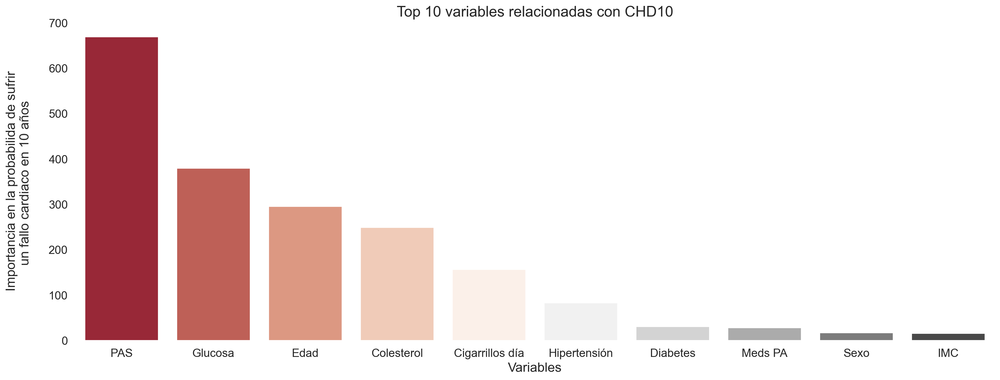

In [80]:
plt.figure(figsize=(20,7)) #Fijamos tamaño del gráfico.
sns.barplot(x='Variable', y='Puntuación', data=top10_variables, palette = "RdGy")
plt.box(False) #Eliminar marco alrededor del gráfico.
plt.title('Top 10 variables relacionadas con CHD10', fontsize=18)
plt.xlabel('Variables', fontsize=16) #Cambiamos el tamaño del título del eje
plt.ylabel('Importancia en la probabilida de sufrir\nun fallo cardiaco en 10 años \n', fontsize=16)
plt.xticks(fontsize=14) #Cambiamos el tamaño de las marcas de los ejes.
plt.yticks(fontsize=14)
plt.show()

Aquellas variables que tienen una mayor relación con la probabilidad de sufrir un fallo cardiaco en 10 años son:
- PAS
- Glucosa
- Edad
- Colesterol
- Cigarrillos día
- Hipertensión
- Diabetes
- Meds PA
- Sexo
- IMC

Con esta selección de variables se crea un nuevo DataFrame que únicamente contiene las 10 variable con mayor relación con nuestra variable final.

In [81]:
data10 = data[['PAS', 'Glucosa', 'Edad', 'Colesterol', 'Cigarrillos día', 'Hipertensión', 'Diabetes', 'Meds PA', 'Sexo', 'IMC', 'CHD10']]

Analizamos la información del nuevo DataFrame.

In [82]:
print(data.shape)
print(data10.shape)

(3656, 15)
(3656, 11)


In [83]:
data10

,PAS,Glucosa,Edad,Colesterol,Cigarrillos día,Hipertensión,Diabetes,Meds PA,Sexo,IMC,CHD10
0,106.0,77.0,39,195.0,0.0,0,0,0.0,1,26.97,0
1,121.0,76.0,46,250.0,0.0,0,0,0.0,0,28.73,0
2,127.5,70.0,48,245.0,20.0,0,0,0.0,1,25.34,0
3,150.0,103.0,61,225.0,30.0,1,0,0.0,0,28.58,1
4,130.0,85.0,46,285.0,23.0,0,0,0.0,0,23.10,0
...,...,...,...,...,...,...,...,...,...,...,...
4231,141.0,81.0,58,187.0,0.0,1,0,0.0,1,24.96,0
4232,168.0,79.0,68,176.0,0.0,1,0,0.0,1,23.14,1
4233,179.0,86.0,50,313.0,1.0,1,0,0.0,1,25.97,1
4234,126.5,68.0,51,207.0,43.0,0,0,0.0,1,19.71,0


In [84]:
data10.describe()

,PAS,Glucosa,Edad,Colesterol,Cigarrillos día,Hipertensión,Diabetes,Meds PA,Sexo,IMC,CHD10
count,3656.000000,3656.000000,3656.000000,3656.000000,3656.000000,3656.000000,3656.000000,3656.000000,3656.000000,3656.000000,3656.000000
mean,132.368025,81.856127,49.557440,236.873085,9.022155,0.311543,0.027079,0.030361,0.443654,25.784185,0.152352
std,22.092444,23.910128,8.561133,44.096223,11.918869,0.463187,0.162335,0.171602,0.496883,4.065913,0.359411
min,83.500000,40.000000,32.000000,113.000000,0.000000,0.000000,0.000000,0.000000,0.000000,15.540000,0.000000
25%,117.000000,71.000000,42.000000,206.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.080000,0.000000
50%,128.000000,78.000000,49.000000,234.000000,0.000000,0.000000,0.000000,0.000000,0.000000,25.380000,0.000000
75%,144.000000,87.000000,56.000000,263.250000,20.000000,1.000000,0.000000,0.000000,1.000000,28.040000,0.000000
max,295.000000,394.000000,70.000000,600.000000,70.000000,1.000000,1.000000,1.000000,1.000000,56.800000,1.000000


Realizamos de nuevo la correlación siguiendo el mismo método utilizado anteriormente.

<Figure size 1500x1500 with 0 Axes>

<Axes: >

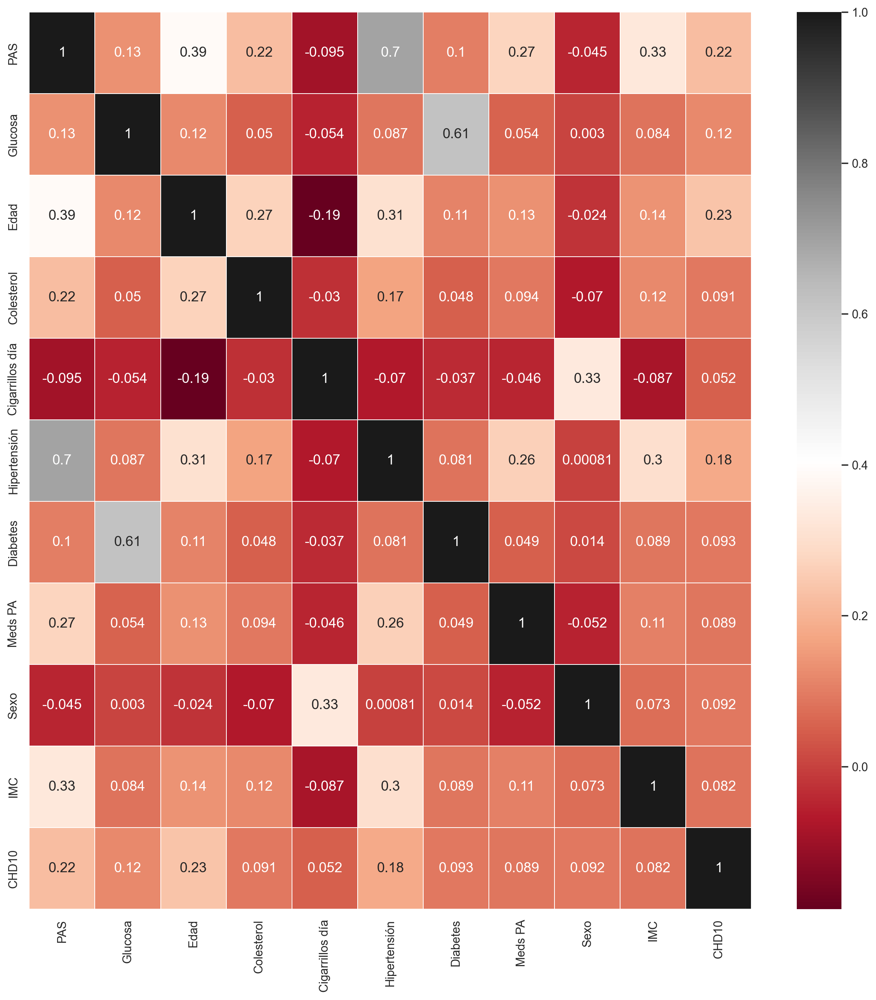

In [85]:
corr_data10 = data10.corr()

plt.figure(figsize=(15,15))
sns.set(font_scale=1)
sns.heatmap(corr_data10, cmap='RdGy', annot=True, linewidths=0.1, annot_kws={"fontsize":13})
plt.show()

Para analizar de una manera más profunda la relación entre cada par de variables del conjunto de datos y entender la correlación entre algunas entidades, se realiza un gráfico de pares. Para cada par de variables, se crea un gráfico que muestra la relación entre esas dos variables. Los gráficos en la diagonal principal muestran la distribución de una sola variable.

En este caso se ha utilizado la función pairplot() de la librería seaborn para crear el gráfico de pares para el DataFrame data10.
Esta función crea un gráfico para cada par de columnas y los organiza en una cuadrícula. Por defecto, se crean gráficos de dispersión para cada par de variables e histogramas para la diagonal principal.

Además, se coloca el argumento hue para colorear los puntos según la variable categórica CHD10.

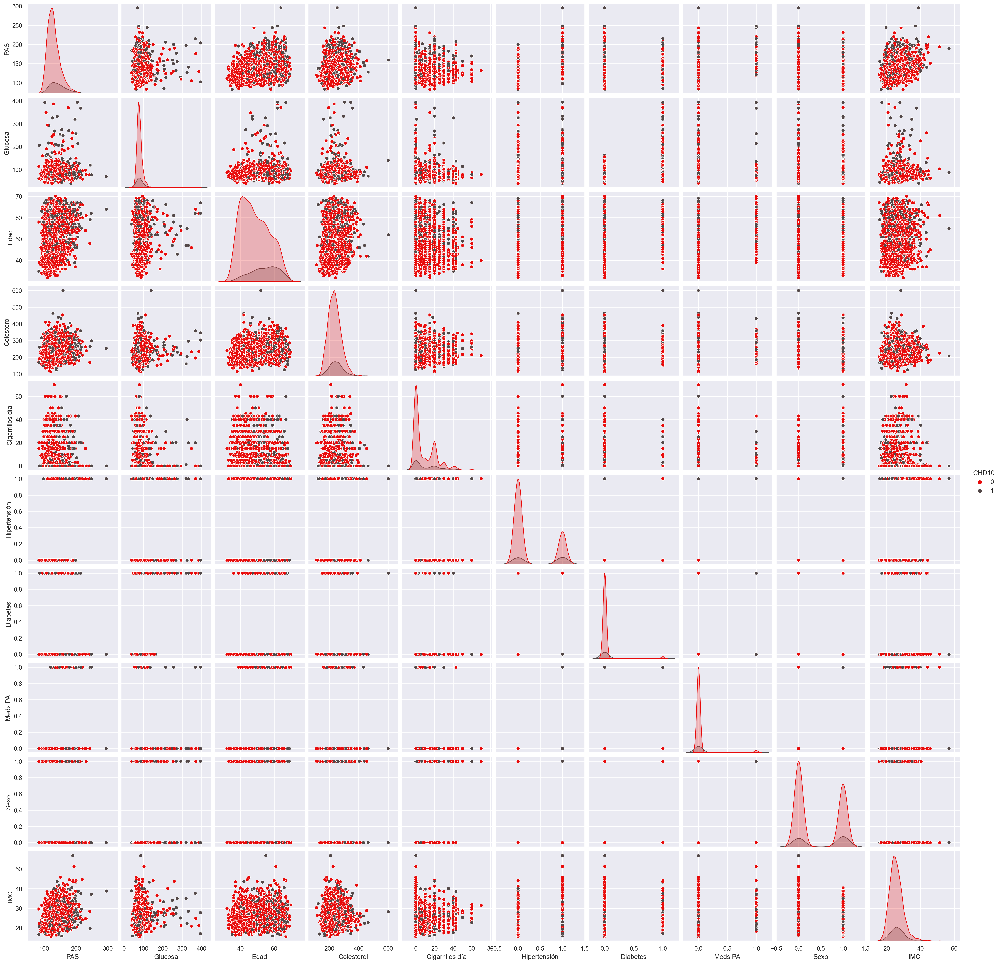

In [86]:
sns.set_palette(["#e80a0a", "#524747"])
sns.pairplot(data10, hue="CHD10")

In [87]:
#Reseteamos el estilo de seaborn.
sns.set_style("ticks")

### Análisis variables categóricas

Analizamos si varía la probabilidad de sufrir una enfermedad cardiaca en función del sexo.

In [88]:
data10["Sexo"].isnull().sum()
data10["Sexo"].unique().tolist()

0

[1, 0]

In [89]:
total_personas = data10["Sexo"].count()
total_hombres = data10["Sexo"].value_counts()[1]
total_mujeres = data10["Sexo"].value_counts()[0]

print("El total de personas es de:", total_personas)
print("De los cuales", total_hombres, "son hombres y", total_mujeres, "son mujeres.")

El total de personas es de: 3656
De los cuales 1622 son hombres y 2034 son mujeres.


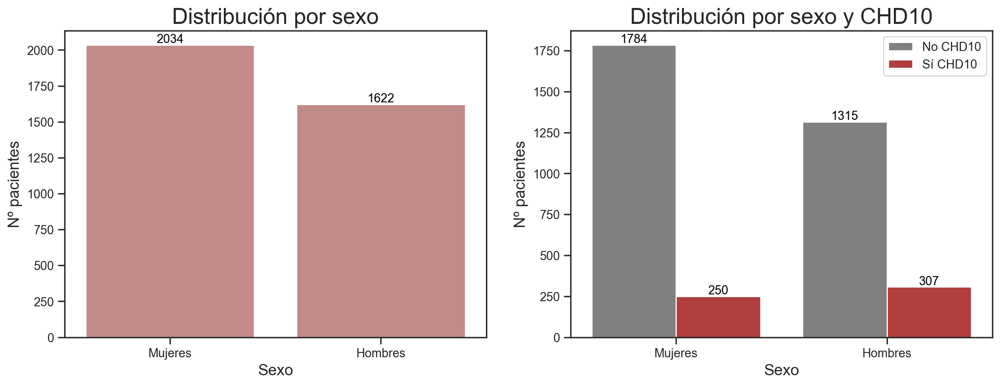

In [115]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(15,5))

fig.patch.set_facecolor('white')
ax1.grid(False)
ax2.grid(False)

sns.countplot(x = data['Sexo'], ax=ax1, color='#cc8181')
sns.countplot(x = data['Sexo'], hue=data['CHD10'], ax=ax2, palette=["gray", "#c52929"])

ax1.set_title('Distribución por sexo', fontsize=20)
ax2.set_title('Distribución por sexo y CHD10', fontsize=20)

ax1.set_xlabel('Sexo', fontsize=14)
ax1.set_ylabel('Nº pacientes', fontsize=14)
ax2.set_xlabel('Sexo', fontsize=14)
ax2.set_ylabel('Nº pacientes', fontsize=14)

ax1.set_xticklabels(['Mujeres', 'Hombres'])
ax2.set_xticklabels(['Mujeres', 'Hombres'])

ax2.legend(['No CHD10', 'Sí CHD10'])

for p in ax1.patches:
    ax1.annotate(str(int(p.get_height())), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=11, color='black', xytext=(0, 5),
                textcoords='offset points')

for p in ax2.patches:
    ax2.annotate(str(int(p.get_height())), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=11, color='black', xytext=(0, 5),
                textcoords='offset points')

plt.show();

In [91]:
print("Probabilidad mujeres NO CHD10 =", round((1784*100)/2034, 2), "%")
print("Probabilidad mujeres SÍ CHD10 =", round((250*100)/2034, 2), "%")

print("Probabilidad hombres NO CHD10 =", round((1315*100)/1622, 2), "%")
print("Probabilidad hombres SÍ CHD10 =", round((307*100)/1622, 2), "%")

Probabilidad mujeres NO CHD10 = 87.71 %
Probabilidad mujeres SÍ CHD10 = 12.29 %
Probabilidad hombres NO CHD10 = 81.07 %
Probabilidad hombres SÍ CHD10 = 18.93 %


Se ha recogido información de 3656 personas, de las cuales 1622 son hombres y 2034 mujeres. 
En la segunda gráfica se observa que el porcentaje de sufrir una enfermedad cardiaca es menor para mujeres que para hombres.

0- Mujeres: 87,71% de NO sufrir una enfermedad cardiaca y un 12,29% de sufrirla.

1- Hombres: 81,07% de NO sufrir una enfermedad cardiaca y un 18,93% de sufrirla.

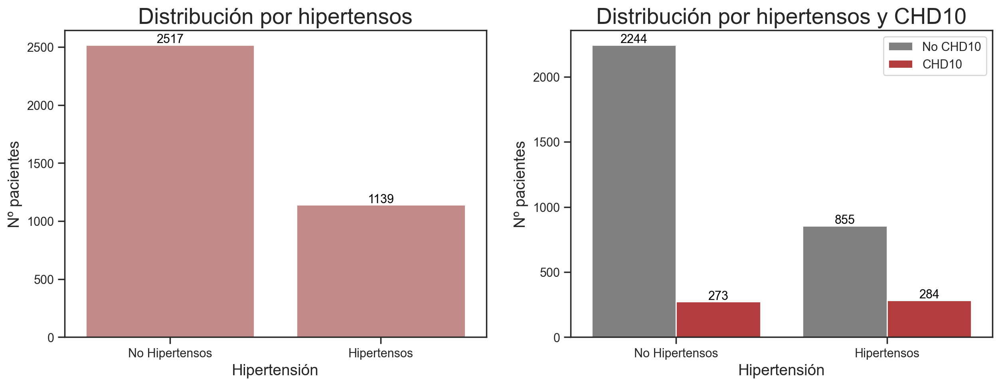

In [116]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(15,5))

fig.patch.set_facecolor('white')
ax1.grid(False)
ax2.grid(False)

sns.countplot(x = data['Hipertensión'], ax=ax1, color='#cc8181')
sns.countplot(x = data['Hipertensión'], hue=data['CHD10'], ax=ax2, palette=["gray", "#c52929"])

ax1.set_title('Distribución por hipertensos', fontsize=20)
ax2.set_title('Distribución por hipertensos y CHD10', fontsize=20)

ax1.set_xlabel('Hipertensión', fontsize=14)
ax1.set_ylabel('Nº pacientes', fontsize=14)
ax2.set_xlabel('Hipertensión', fontsize=14)
ax2.set_ylabel('Nº pacientes', fontsize=14)

ax1.set_xticklabels(['No Hipertensos', 'Hipertensos'])
ax2.set_xticklabels(['No Hipertensos', 'Hipertensos'])

ax2.legend(['No CHD10', 'CHD10'])

for p in ax1.patches:
    ax1.annotate(str(int(p.get_height())), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=11, color='black', xytext=(0, 5),
                textcoords='offset points')

for p in ax2.patches:
    ax2.annotate(str(int(p.get_height())), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=11, color='black', xytext=(0, 5),
                textcoords='offset points')

plt.show();

In [114]:
print("Probabilidad no hipertensos NO CHD10 =", round((2244*100)/2517, 2), "%")
print("Probabilidad no hipertensos SÍ CHD10 =", round((273*100)/2517, 2), "%")

print("Probabilidad hipertensos NO CHD10 =", round((855*100)/1139, 2), "%")
print("Probabilidad hipertensos SÍ CHD10 =", round((284*100)/1139, 2), "%")

Probabilidad no hipertensos NO CHD10 = 89.15 %
Probabilidad no hipertensos SÍ CHD10 = 10.85 %
Probabilidad hipertensos NO CHD10 = 75.07 %
Probabilidad hipertensos SÍ CHD10 = 24.93 %


En la segunda gráfica anterior se observa que el porcentaje de sufrir una enfermedad cardiaca es mayor si el paciente es hipertenso.

<Axes: xlabel='Diabetes', ylabel='count'>

<Axes: xlabel='Diabetes', ylabel='count'>

Text(0.5, 1.0, 'Distribución por diabéticos')

Text(0.5, 1.0, 'Distribución por diabéticos y CHD10')

Text(0.5, 0, 'Diabetes')

Text(0, 0.5, 'Nº pacientes')

Text(0.5, 0, 'Diabetes')

Text(0, 0.5, 'Nº pacientes')

[Text(0, 0, 'No Diabéticos'), Text(1, 0, 'Diabéticos')]

[Text(0, 0, 'No Diabéticos'), Text(1, 0, 'Diabéticos')]

Text(0, 5, '3557')

Text(0, 5, '99')

Text(0, 5, '3035')

Text(0, 5, '64')

Text(0, 5, '522')

Text(0, 5, '35')

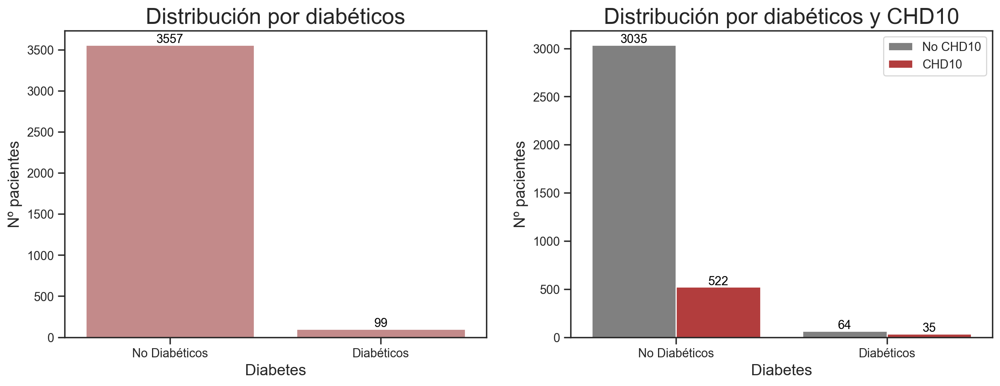

In [102]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(15,5))

fig.patch.set_facecolor('white')
ax1.grid(False)
ax2.grid(False)

sns.countplot(x = data['Diabetes'], ax=ax1, color='#cc8181')
sns.countplot(x = data['Diabetes'], hue=data['CHD10'], ax=ax2, palette=["gray", "#c52929"])

ax1.set_title('Distribución por diabéticos', fontsize=20)
ax2.set_title('Distribución por diabéticos y CHD10', fontsize=20)

ax1.set_xlabel('Diabetes', fontsize=14)
ax1.set_ylabel('Nº pacientes', fontsize=14)
ax2.set_xlabel('Diabetes', fontsize=14)
ax2.set_ylabel('Nº pacientes', fontsize=14)

ax1.set_xticklabels(['No Diabéticos', 'Diabéticos'])
ax2.set_xticklabels(['No Diabéticos', 'Diabéticos'])

ax2.legend(['No CHD10', 'CHD10'])

for p in ax1.patches:
    ax1.annotate(str(int(p.get_height())), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=11, color='black', xytext=(0, 5),
                textcoords='offset points')

for p in ax2.patches:
    ax2.annotate(str(int(p.get_height())), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=11, color='black', xytext=(0, 5),
                textcoords='offset points')

plt.show();

In [117]:
print("Probabilidad no diabéticos NO CHD10 =", round((3035*100)/3557, 2), "%")
print("Probabilidad no diabéticos SÍ CHD10 =", round((522*100)/3557, 2), "%")

print("Probabilidad diabéticos NO CHD10 =", round((64*100)/99, 2), "%")
print("Probabilidad diabéticos SÍ CHD10 =", round((35*100)/99, 2), "%")

Probabilidad no diabéticos NO CHD10 = 85.32 %
Probabilidad no diabéticos SÍ CHD10 = 14.68 %
Probabilidad diabéticos NO CHD10 = 64.65 %
Probabilidad diabéticos SÍ CHD10 = 35.35 %


De la gráfica anterior se puede concluir que la probabilidad de sufrir un CHD10 es mayor que el doble para los pacientes diabéticos en comparación con los no diabéticos.

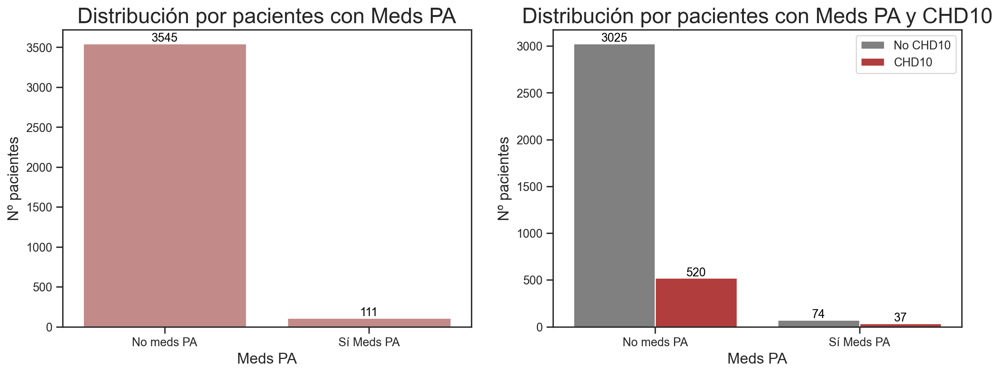

In [119]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(15,5))

fig.patch.set_facecolor('white')
ax1.grid(False)
ax2.grid(False)

sns.countplot(x = data['Meds PA'], ax=ax1, color='#cc8181')
sns.countplot(x = data['Meds PA'], hue=data['CHD10'], ax=ax2, palette=["gray", "#c52929"])

ax1.set_title('Distribución por pacientes con Meds PA', fontsize=20)
ax2.set_title('Distribución por pacientes con Meds PA y CHD10', fontsize=20)

ax1.set_xlabel('Meds PA', fontsize=14)
ax1.set_ylabel('Nº pacientes', fontsize=14)
ax2.set_xlabel('Meds PA', fontsize=14)
ax2.set_ylabel('Nº pacientes', fontsize=14)

ax1.set_xticklabels(['No meds PA', 'Sí Meds PA'])
ax2.set_xticklabels(['No meds PA', 'Sí Meds PA'])

ax2.legend(['No CHD10', 'CHD10'])

for p in ax1.patches:
    ax1.annotate(str(int(p.get_height())), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=11, color='black', xytext=(0, 5),
                textcoords='offset points')

for p in ax2.patches:
    ax2.annotate(str(int(p.get_height())), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=11, color='black', xytext=(0, 5),
                textcoords='offset points')

plt.show();

In [121]:
print("Probabilidad pacientes sin Meds PA y NO CHD10 =", round((3025*100)/3545, 2), "%")
print("Probabilidad pacientes sin Meds PA y SÍ CHD10 =", round((520*100)/3545, 2), "%")

print("Probabilidad pacientes con Meds PA y NO CHD10 =", round((74*100)/111, 2), "%")
print("Probabilidad pacientes con Meds PA y SÍ CHD10 =", round((37*100)/111, 2), "%")

Probabilidad pacientes sin Meds PA y NO CHD10 = 85.33 %
Probabilidad pacientes sin Meds PA y SÍ CHD10 = 14.67 %
Probabilidad pacientes con Meds PA y NO CHD10 = 66.67 %
Probabilidad pacientes con Meds PA y SÍ CHD10 = 33.33 %


De la gráfica anterior se observa que aquellos pacientes que tienen una presión arterial elevada tienen mayor probabilidad de sufrir un CHD10 aún tomando medicación.

## Analizamos variables numéricas

El gráfico de caja (boxplot) muestra la distribución de los datos a través de sus cuartiles. La línea central representa la mediana, el cuadro representa el rango intercuartil (IQR) y las líneas verticales (bigotes) representan los valores mínimo y máximo dentro de 1.5 veces el IQR. Los puntos fuera de los bigotes se consideran valores atípicos12.

El gráfico de enjambre (swarmplot) muestra cada punto de datos individual en una distribución. Este tipo de gráfico muestra la distribución de los datos en una variable categórica y una variable numérica. En este caso, el eje x representa la variable categórica ‘CHD10’ y el eje y representa para cada gráfico una de las variables numéricas de estudio. La función swarmplot() se utiliza para visualizar los datos de manera más clara y evitar que se superpongan.

El gráfico de violín (violinplot) es similar al gráfico de caja, pero muestra la distribución completa de los datos. La forma del violín representa la densidad estimada de los datos y la línea central representa la mediana

<Axes: xlabel='CHD10', ylabel='Edad'>

C:\Users\Cristina\AppData\Local\Temp\ipykernel_2360\1023811391.py:8: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  sns.swarmplot(x='CHD10', y='Edad', data=data10, ax=ax2, size=3, palette=["gray", "#c52929"])
c:\Users\Cristina\anaconda3\envs\eda_env\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 42.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


<Axes: xlabel='CHD10', ylabel='Edad'>

<Axes: xlabel='CHD10', ylabel='Edad'>

Text(0.5, 0.98, 'Distribución por edad')

[Text(0, 0, 'No CHD10'), Text(1, 0, 'CHD10')]

C:\Users\Cristina\AppData\Local\Temp\ipykernel_2360\1023811391.py:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_xticklabels(['No CHD10', 'CHD10'])


[Text(0, 0, 'No CHD10'), Text(1, 0, 'CHD10')]

[Text(0, 0, 'No CHD10'), Text(1, 0, 'CHD10')]

c:\Users\Cristina\anaconda3\envs\eda_env\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 66.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


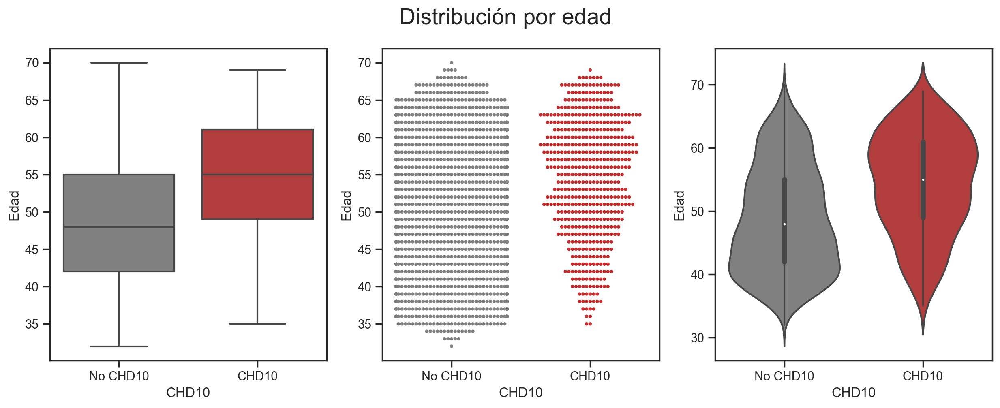

In [107]:
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(15,5))

fig.patch.set_facecolor('white')
ax1.grid(False)
ax2.grid(False)

sns.boxplot(x='CHD10', y='Edad', data=data10, ax=ax1, palette=["gray", "#c52929"])
sns.swarmplot(x='CHD10', y='Edad', data=data10, ax=ax2, size=3, palette=["gray", "#c52929"])
sns.violinplot(x='CHD10', y='Edad', data=data10, ax=ax3, palette=["gray", "#c52929"])

fig.suptitle('Distribución por edad', fontsize=20)

ax1.set_xticklabels(['No CHD10', 'CHD10'])
ax2.set_xticklabels(['No CHD10', 'CHD10'])
ax3.set_xticklabels(['No CHD10', 'CHD10'])

plt.show()

De los gráficos anteriores se observa que la mayoría de los pacientes de edad alrededor de 40-50 tienen un riesgo menor de sufrir una enfermedad cardiaca, mientras que el riesgo aumenta a partir de los 50 años.

C:\Users\Cristina\AppData\Local\Temp\ipykernel_2360\370635325.py:8: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  sns.swarmplot(x='CHD10', y='PAS', data=data10, ax=ax2, size=3, palette=["gray", "#c52929"])
c:\Users\Cristina\anaconda3\envs\eda_env\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 47.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Cristina\AppData\Local\Temp\ipykernel_2360\370635325.py:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_xticklabels(['No CHD10', 'CHD10'])
c:\Users\Cristina\anaconda3\envs\eda_env\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 65.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


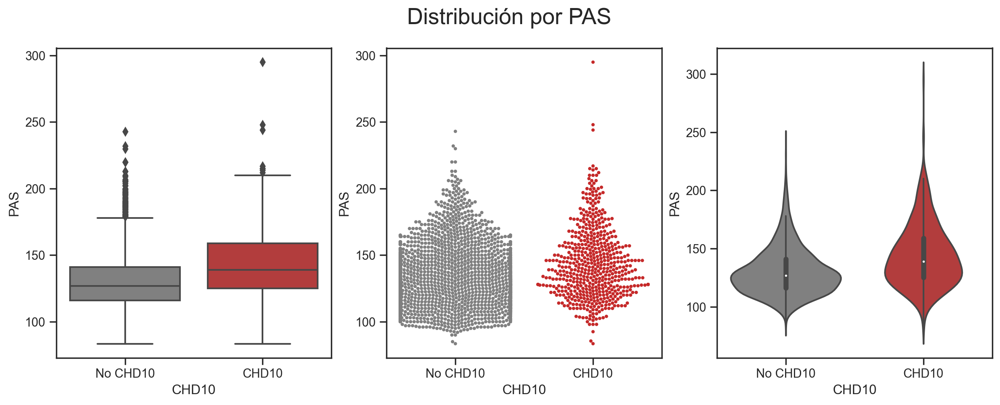

In [108]:
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(15,5))

fig.patch.set_facecolor('white')
ax1.grid(False)
ax2.grid(False)

sns.boxplot(x='CHD10', y='PAS', data=data10, ax=ax1, palette=["gray", "#c52929"])
sns.swarmplot(x='CHD10', y='PAS', data=data10, ax=ax2, size=3, palette=["gray", "#c52929"])
sns.violinplot(x='CHD10', y='PAS', data=data10, ax=ax3, palette=["gray", "#c52929"])

fig.suptitle('Distribución por PAS', fontsize=20)

ax1.set_xticklabels(['No CHD10', 'CHD10'])
ax2.set_xticklabels(['No CHD10', 'CHD10'])
ax3.set_xticklabels(['No CHD10', 'CHD10'])

plt.show();

De los gráficos anteriores se observa que el riesgo de sufrir un CHD10 aumenta a PAS más elevadas.

C:\Users\Cristina\AppData\Local\Temp\ipykernel_2360\3718382980.py:8: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  sns.swarmplot(x='CHD10', y='IMC', data=data10, ax=ax2, size=3, palette=["gray", "#c52929"])
c:\Users\Cristina\anaconda3\envs\eda_env\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 43.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Cristina\AppData\Local\Temp\ipykernel_2360\3718382980.py:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_xticklabels(['No CHD10', 'CHD10'])
c:\Users\Cristina\anaconda3\envs\eda_env\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 63.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


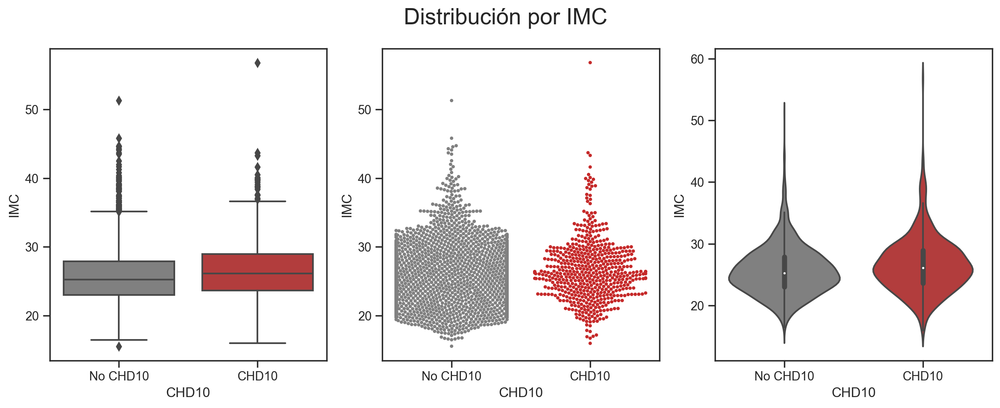

In [109]:
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(15,5))

fig.patch.set_facecolor('white')
ax1.grid(False)
ax2.grid(False)

sns.boxplot(x='CHD10', y='IMC', data=data10, ax=ax1, palette=["gray", "#c52929"])
sns.swarmplot(x='CHD10', y='IMC', data=data10, ax=ax2, size=3, palette=["gray", "#c52929"])
sns.violinplot(x='CHD10', y='IMC', data=data10, ax=ax3, palette=["gray", "#c52929"])

fig.suptitle('Distribución por IMC', fontsize=20)

ax1.set_xticklabels(['No CHD10', 'CHD10'])
ax2.set_xticklabels(['No CHD10', 'CHD10'])
ax3.set_xticklabels(['No CHD10', 'CHD10'])


plt.show();

De las gráficas anteriores se puede observar que no hay una dieferencia significativa con respecto a sufrir un CHD10 en relación con el IMC del paciente.

C:\Users\Cristina\AppData\Local\Temp\ipykernel_2360\4240769177.py:8: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  sns.swarmplot(x='CHD10', y='Glucosa', data=data10, ax=ax2, size=3, palette=["gray", "#c52929"])
c:\Users\Cristina\anaconda3\envs\eda_env\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 72.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\Cristina\anaconda3\envs\eda_env\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 11.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Cristina\AppData\Local\Temp\ipykernel_2360\4240769177.py:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_xticklabels(['No CHD10', 'CHD10'])
c:\Users\Cristina\anaconda3\envs\eda_env\lib\site-packages\seaborn\categorical.py:3544: Use

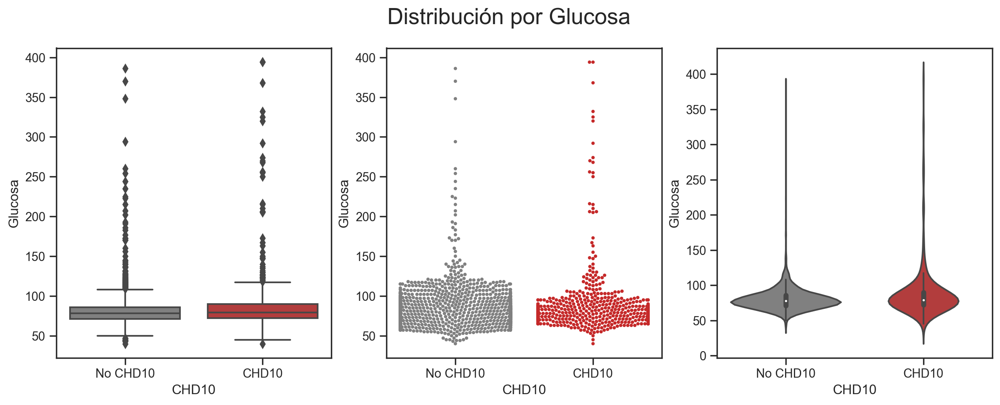

In [110]:
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(15,5))

fig.patch.set_facecolor('white')
ax1.grid(False)
ax2.grid(False)

sns.boxplot(x='CHD10', y='Glucosa', data=data10, ax=ax1, palette=["gray", "#c52929"])
sns.swarmplot(x='CHD10', y='Glucosa', data=data10, ax=ax2, size=3, palette=["gray", "#c52929"])
sns.violinplot(x='CHD10', y='Glucosa', data=data10, ax=ax3, palette=["gray", "#c52929"])

fig.suptitle('Distribución por Glucosa', fontsize=20)

ax1.set_xticklabels(['No CHD10', 'CHD10'])
ax2.set_xticklabels(['No CHD10', 'CHD10'])
ax3.set_xticklabels(['No CHD10', 'CHD10'])

plt.show();

De las gráficas anteriores se puede observar que no hay una dieferencia significativa con respecto a sufrir un CHD10 en relación con la variable glucosa.

C:\Users\Cristina\AppData\Local\Temp\ipykernel_2360\4294358895.py:8: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  sns.swarmplot(x='CHD10', y='Colesterol', data=data10, ax=ax2, palette=["gray", "#c52929"])
c:\Users\Cristina\anaconda3\envs\eda_env\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 75.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\Cristina\anaconda3\envs\eda_env\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 16.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Cristina\AppData\Local\Temp\ipykernel_2360\4294358895.py:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_xticklabels(['No CHD10', 'CHD10'])
c:\Users\Cristina\anaconda3\envs\eda_env\lib\site-packages\seaborn\categorical.py:3544: UserWarn

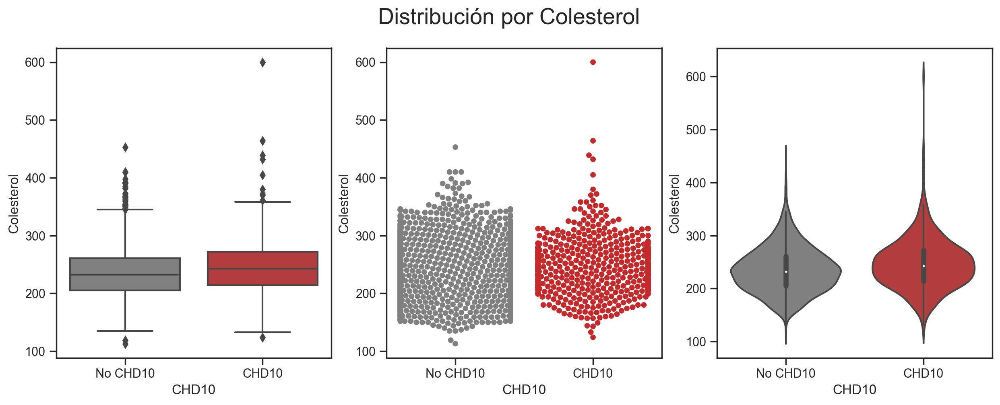

In [111]:
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(15,5))

fig.patch.set_facecolor('white')
ax1.grid(False)
ax2.grid(False)

sns.boxplot(x='CHD10', y='Colesterol', data=data10, ax=ax1, palette=["gray", "#c52929"])
sns.swarmplot(x='CHD10', y='Colesterol', data=data10, ax=ax2, palette=["gray", "#c52929"])
sns.violinplot(x='CHD10', y='Colesterol', data=data10, ax=ax3, palette=["gray", "#c52929"])

fig.suptitle('Distribución por Colesterol', fontsize=20)

ax1.set_xticklabels(['No CHD10', 'CHD10'])
ax2.set_xticklabels(['No CHD10', 'CHD10'])
ax3.set_xticklabels(['No CHD10', 'CHD10'])

plt.show();

De las gráficas anteriores se puede observar que no hay una dieferencia significativa con respecto a sufrir un CHD10 en relación a la variable colesterol.

C:\Users\Cristina\AppData\Local\Temp\ipykernel_2360\759742239.py:8: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  sns.swarmplot(x='CHD10', y='Cigarrillos día', data=data10, ax=ax2, palette=["gray", "#c52929"])
c:\Users\Cristina\anaconda3\envs\eda_env\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 86.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\Cristina\anaconda3\envs\eda_env\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 56.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Cristina\AppData\Local\Temp\ipykernel_2360\759742239.py:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_xticklabels(['No CHD10', 'CHD10'])
c:\Users\Cristina\anaconda3\envs\eda_env\lib\site-packages\seaborn\categorical.py:3544: UserW

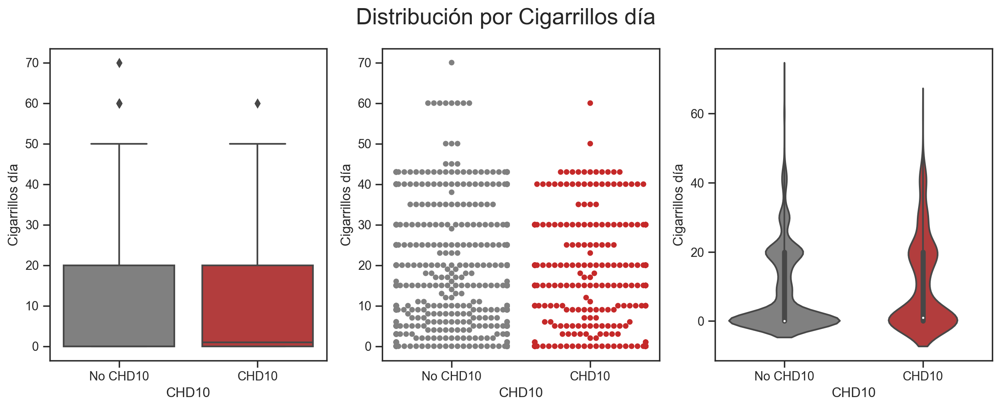

In [112]:
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(15,5))

fig.patch.set_facecolor('white')
ax1.grid(False)
ax2.grid(False)

sns.boxplot(x='CHD10', y='Cigarrillos día', data=data10, ax=ax1, palette=["gray", "#c52929"])
sns.swarmplot(x='CHD10', y='Cigarrillos día', data=data10, ax=ax2, palette=["gray", "#c52929"])
sns.violinplot(x='CHD10', y='Cigarrillos día', data=data10, ax=ax3, palette=["gray", "#c52929"])

fig.suptitle('Distribución por Cigarrillos día', fontsize=20)

ax1.set_xticklabels(['No CHD10', 'CHD10'])
ax2.set_xticklabels(['No CHD10', 'CHD10'])
ax3.set_xticklabels(['No CHD10', 'CHD10'])

plt.show();

De las gráficas anteriores se puede observar que no hay una dieferencia significativa con respecto a sufrir un CHD10 en relación la cantidad del cigarrillos que consume el paciente al día.

# Machine Learning

## Escala de características <a name="paragraph2"></a>
Escalamos nuestras variables utilizando para ello el método Min-Max Scaler.